In [1]:
from datetime  import datetime
from torchvision import datasets, models, transforms
from torch.optim import lr_scheduler
import torchvision.models as models
from image_dataset import ImageDataset
from torch.utils.data import DataLoader
import seaborn as sns
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from image_dataset import ImageDataset

In [2]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu" #Specifies whether to use GPU ('cuda') or CPU ('cpu') for training; "cuda" is prior to "cpu"
EPOCHS = 15 #Number of training epochs.
BATCHSIZE = 4 #Batch size used during training.
NUM_CLASSES = 3 #Number of output classes
#Constants and Configuration

In [3]:
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Transform for validation (without RandomHorizontalFlip)
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

train_dataset = ImageDataset(path_name="train",transform=train_transform)
train_data_loader = DataLoader(train_dataset, batch_size=BATCHSIZE, shuffle=True)
#create the training set object, use the path name to return the image and use the created transform to process the data
val_dataset = ImageDataset(path_name="val", transform=val_transform)
val_dataloader = DataLoader(val_dataset, batch_size=BATCHSIZE, shuffle=True)

Class path: train/pneumonia
Adding file: train/pneumonia/00006966_004.png
Adding file: train/pneumonia/person755_bacteria_2659.jpeg
Adding file: train/pneumonia/person276_bacteria_1296.jpeg
Adding file: train/pneumonia/person124_virus_238.jpeg
Adding file: train/pneumonia/person1491_bacteria_3893.jpeg
Adding file: train/pneumonia/person69_bacteria_338.jpeg
Adding file: train/pneumonia/person688_bacteria_2584.jpeg
Adding file: train/pneumonia/person1222_bacteria_3177.jpeg
Adding file: train/pneumonia/person581_bacteria_2392.jpeg
Adding file: train/pneumonia/person1233_virus_2090.jpeg
Adding file: train/pneumonia/person1253_virus_2129.jpeg
Adding file: train/pneumonia/person1415_bacteria_3629.jpeg
Adding file: train/pneumonia/person472_bacteria_2015.jpeg
Adding file: train/pneumonia/person437_bacteria_1887.jpeg
Adding file: train/pneumonia/person60_bacteria_287.jpeg
Adding file: train/pneumonia/person1431_bacteria_3698.jpeg
Adding file: train/pneumonia/00015734_000.png
Adding file: train

Index: 0, Dataset Size: 4111
Loaded image at train/pneumonia/00006966_004.png with label pneumonia
Index: 1, Dataset Size: 4111
Loaded image at train/pneumonia/person755_bacteria_2659.jpeg with label pneumonia
Index: 2, Dataset Size: 4111
Loaded image at train/pneumonia/person276_bacteria_1296.jpeg with label pneumonia
Index: 3, Dataset Size: 4111
Loaded image at train/pneumonia/person124_virus_238.jpeg with label pneumonia
Index: 4, Dataset Size: 4111
Loaded image at train/pneumonia/person1491_bacteria_3893.jpeg with label pneumonia
Index: 5, Dataset Size: 4111
Loaded image at train/pneumonia/person69_bacteria_338.jpeg with label pneumonia
Index: 6, Dataset Size: 4111
Loaded image at train/pneumonia/person688_bacteria_2584.jpeg with label pneumonia
Index: 7, Dataset Size: 4111
Loaded image at train/pneumonia/person1222_bacteria_3177.jpeg with label pneumonia
Index: 8, Dataset Size: 4111
Loaded image at train/pneumonia/person581_bacteria_2392.jpeg with label pneumonia
Index: 9, Dataset

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 1257, Dataset Size: 1376
Loaded image at val/covid/COVID19(455).jpg with label covid
Index: 1258, Dataset Size: 1376
Loaded image at val/covid/468.jpg with label covid
Index: 1259, Dataset Size: 1376
Loaded image at val/covid/326.jpg with label covid
Index: 1260, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (634).jpg with label covid
Index: 1261, Dataset Size: 1376
Loaded image at val/covid/COVID19(117).jpg with label covid
Index: 1262, Dataset Size: 1376
Loaded image at val/covid/COVID19(58).jpg with label covid
Index: 1263, Dataset Size: 1376
Loaded image at val/covid/539-.png with label covid
Index: 1264, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (404).jpg with label covid
Index: 1265, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (812).jpg with label covid
Index: 1266, Dataset Size: 1376
Loaded image at val/covid/F2DE909F-E19C-4900-92F5-8F435B031AC6.jpeg with label covid
Index: 1267, Dataset Size

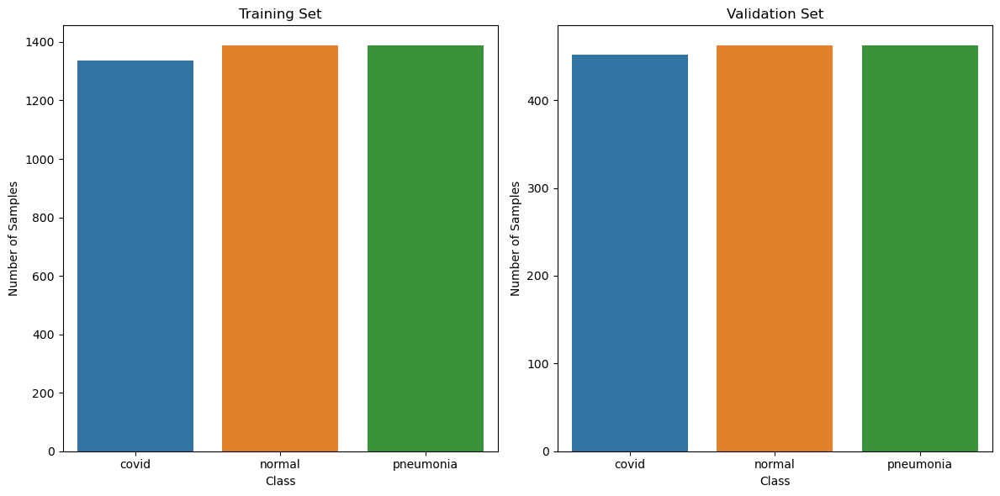

Index: 0, Dataset Size: 4111
Loaded image at train/pneumonia/00006966_004.png with label pneumonia
Index: 1, Dataset Size: 4111
Loaded image at train/pneumonia/person755_bacteria_2659.jpeg with label pneumonia
Index: 2, Dataset Size: 4111
Loaded image at train/pneumonia/person276_bacteria_1296.jpeg with label pneumonia
Index: 3, Dataset Size: 4111
Loaded image at train/pneumonia/person124_virus_238.jpeg with label pneumonia
Index: 4, Dataset Size: 4111
Loaded image at train/pneumonia/person1491_bacteria_3893.jpeg with label pneumonia
Index: 5, Dataset Size: 4111
Loaded image at train/pneumonia/person69_bacteria_338.jpeg with label pneumonia
Index: 6, Dataset Size: 4111
Loaded image at train/pneumonia/person688_bacteria_2584.jpeg with label pneumonia
Index: 7, Dataset Size: 4111
Loaded image at train/pneumonia/person1222_bacteria_3177.jpeg with label pneumonia
Index: 8, Dataset Size: 4111
Loaded image at train/pneumonia/person581_bacteria_2392.jpeg with label pneumonia
Index: 9, Dataset

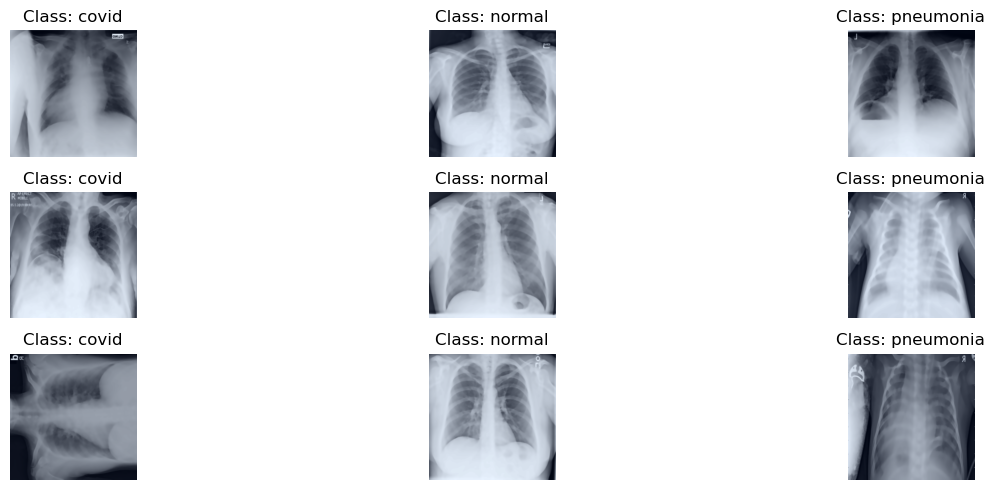

In [4]:
def count_samples(dataset):
    # Count the number of samples in each class
    class_counts = {"covid": 0, "normal": 0, "pneumonia": 0}
    
    for i in range(len(dataset)):
        _, label_idx = dataset[i]
        label = dataset.idx_to_label(label_idx.item())  # Convert tensor to string label
        class_counts[label] += 1
    
    return class_counts



def plot_class_distribution(dataset_1, dataset_2):
    train_counts = count_samples(dataset_1)
    val_counts = count_samples(dataset_2)
    # taking as input two datasets, calculates the number of samples in each of them for each category
    # ploting a bar chart showing the distribution of the categories via the seaborn library
    # Plotting
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    sns.barplot(x=list(train_counts.keys()), y=list(train_counts.values()), ax=ax[0])
    ax[0].set_title("Training Set")
    ax[0].set_ylabel("Number of Samples")
    ax[0].set_xlabel("Class")

    sns.barplot(x=list(val_counts.keys()), y=list(val_counts.values()), ax=ax[1])
    ax[1].set_title("Validation Set")
    ax[1].set_ylabel("Number of Samples")
    ax[1].set_xlabel("Class")

    plt.tight_layout()
    plt.show()


def show_images_from_classes(dataset, num_images=3):
    # Store images for each class
    images_to_show = {'covid': [], 'normal': [], 'pneumonia': []}
    #taking a dataset as input, and the number of images to display for each category (default is 3)
    #It iterates through the dataset, selects the top few images for each category, and displays those images.
    for image, label_idx in dataset:
        label = dataset.idx_to_label(label_idx.item())  # Convert tensor to string label
        if len(images_to_show[label]) < num_images:
            image_np = image.numpy()
            image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())
            images_to_show[label].append(image_np)

        if all(len(images) == num_images for images in images_to_show.values()):
            break

    # Plotting
    fig, axes = plt.subplots(num_images, len(images_to_show), figsize=(15, 5))

    for i, (label, images) in enumerate(images_to_show.items()):
        for j, image in enumerate(images):
            ax = axes[j][i] if num_images > 1 else axes[i]
            ax.imshow(np.transpose(image, (1, 2, 0)))  # Convert image back to HxWxC format
            ax.set_title(f"Class: {label}")
            ax.axis('off')

    plt.tight_layout()
    plt.show()


plot_class_distribution(train_dataset, val_dataset)

show_images_from_classes(train_dataset)

In [5]:
model = models.densenet121(pretrained=True)
#Loading the pre-trained DenseNet-121 model(121 layers of parameters were used)
num_ftrs = model.classifier.in_features
#retrieving the number of input features (or neurons) in the last fully connected classifier of the pre-trained DenseNet-121 model
model.classifier = nn.Linear(num_ftrs, NUM_CLASSES)
#replacing the existing classifier; a linear layer with input features (num_ftrs) and output features equal to the number of classes in your specific problem (NUM_CLASSES).
model = model.to(DEVICE)#move to device(CPU or GPU)


criterion = nn.CrossEntropyLoss()#instantiated
#the loss function which is commonly used to measure the difference between the model's output and the actual labels. 
optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
#creating a Stochastic Gradient Descent (SGD) optimizer which is to minimize the loss by adjusting the model's weights. 
#lr=0.01 sets the learning rate, and momentum=0.9 is a hyperparameter for the SGD optimizer, helping to accelerate gradient updates.
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
#Learning rate schedulers dynamically adjust the learning rate during training to facilitate better convergence to the optimal solution.
#StepLR scheduler is used, which multiplies the learning rate by gamma every step_size epochs. 

train_losses, val_losses = [], []
#store training and validation losses during the training process.

/Users/victorumesiobi/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/victorumesiobi/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [6]:
start_time = datetime.now()
print(f"Training started at {start_time.strftime('%Y-%m-%d %H:%M:%S')}")

Training started at 2023-12-16 14:30:49


In [7]:
for epoch in range(EPOCHS): #training loop:train EPOCHS times.Each epoch corresponds to a complete pass through the entire training dataset.
    model.train()
    #Sets the model to training mode.
    running_train_loss, running_val_loss = 0.0, 0.0

    for i, data in enumerate(train_data_loader):
        image, label = data
        image = image.to(DEVICE)
        label = label.to(DEVICE)

        optimizer.zero_grad()
        # Clears the gradients of all optimized parameters. This is necessary before computing gradients in the backward pass.

        output = model(image.float())
        # Forward pass: computes the output predictions of the model for the given input.

        train_loss = criterion(output.float(), label.long())
        #Computes the training loss by comparing the model's output with the actual labels

        train_loss.backward()
        optimizer.step()
        #Backward pass: computes the gradients of the model parameters with respect to the loss and updates the model's weights using the optimizer.

        running_train_loss += train_loss.item()
        print(f"Epoch: {epoch}, Iteration: {i}, Loss: {train_loss.item()}")
        #Updates the running training loss and prints the current loss for monitoring.

    exp_lr_scheduler.step()  # Update the learning rate

    train_losses.append(running_train_loss)

    model.eval()
    #Sets the model to evaluation mode. This is important because certain layers may behave differently during evaluation.

    #Similar to the training loop, but this loop evaluates the model on the validation dataset without performing backpropagation.
    with torch.no_grad():#used to disable gradient computation, saving memory and speeding up the inference process
        for i, data in enumerate(val_dataloader):
            image, label = data
            image = image.to(DEVICE)
            label = label.to(DEVICE)

            output = model(image.float())

            val_loss = criterion(output.float(), label.long())
            running_val_loss += val_loss.item()

    val_losses.append(running_val_loss)

Index: 1240, Dataset Size: 4111
Loaded image at train/pneumonia/person67_bacteria_332.jpeg with label pneumonia
Index: 1261, Dataset Size: 4111
Loaded image at train/pneumonia/person567_bacteria_2352.jpeg with label pneumonia
Index: 6, Dataset Size: 4111
Loaded image at train/pneumonia/person688_bacteria_2584.jpeg with label pneumonia
Index: 3810, Dataset Size: 4111
Loaded image at train/covid/COVID-19 (63).jpg with label covid
Epoch: 0, Iteration: 0, Loss: 1.5050814151763916
Index: 415, Dataset Size: 4111
Loaded image at train/pneumonia/person1155_bacteria_3100.jpeg with label pneumonia
Index: 2567, Dataset Size: 4111
Loaded image at train/normal/00000317_003.png with label normal
Index: 3424, Dataset Size: 4111
Loaded image at train/covid/COVID19(21).jpg with label covid
Index: 1361, Dataset Size: 4111
Loaded image at train/pneumonia/person717_bacteria_2618.jpeg with label pneumonia
Epoch: 0, Iteration: 1, Loss: 1.6210567951202393
Index: 424, Dataset Size: 4111
Loaded image at train/

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 435, Dataset Size: 1376
Loaded image at val/pneumonia/person574_virus_1118.jpeg with label pneumonia
Index: 1215, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (784).jpg with label covid
Index: 910, Dataset Size: 1376
Loaded image at val/normal/00000624_005.png with label normal
Index: 1114, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (773).jpg with label covid
Index: 1272, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (59).jpg with label covid
Index: 557, Dataset Size: 1376
Loaded image at val/normal/00000013_019.png with label normal
Index: 621, Dataset Size: 1376
Loaded image at val/normal/00000059_001.png with label normal
Index: 226, Dataset Size: 1376
Loaded image at val/pneumonia/person1468_bacteria_3822.jpeg with label pneumonia
Index: 1010, Dataset Size: 1376
Loaded image at val/covid/COVID19(148).jpg with label covid
Index: 1101, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (801).jpg 

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 968, Dataset Size: 1376
Loaded image at val/covid/COVID19(485).jpg with label covid
Index: 513, Dataset Size: 1376
Loaded image at val/normal/00000360_007.png with label normal
Index: 353, Dataset Size: 1376
Loaded image at val/pneumonia/person1411_bacteria_3602.jpeg with label pneumonia
Index: 166, Dataset Size: 1376
Loaded image at val/pneumonia/person1732_bacteria_4564.jpeg with label pneumonia
Index: 560, Dataset Size: 1376
Loaded image at val/normal/00000954_000.png with label normal
Index: 328, Dataset Size: 1376
Loaded image at val/pneumonia/person1723_bacteria_4548.jpeg with label pneumonia
Index: 108, Dataset Size: 1376
Loaded image at val/pneumonia/person41_bacteria_207.jpeg with label pneumonia
Index: 368, Dataset Size: 1376
Loaded image at val/pneumonia/person711_bacteria_2612.jpeg with label pneumonia
Index: 42, Dataset Size: 1376
Loaded image at val/pneumonia/person384_bacteria_1755.jpeg with label pneumonia
Index:

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 340, Dataset Size: 1376
Loaded image at val/pneumonia/person989_virus_1667.jpeg with label pneumonia
Index: 1333, Dataset Size: 1376
Loaded image at val/covid/COVID19(412).jpg with label covid
Index: 265, Dataset Size: 1376
Loaded image at val/pneumonia/person49_bacteria_236.jpeg with label pneumonia
Index: 23, Dataset Size: 1376
Loaded image at val/pneumonia/person36_bacteria_183.jpeg with label pneumonia
Index: 807, Dataset Size: 1376
Loaded image at val/normal/00000938_000.png with label normal
Index: 305, Dataset Size: 1376
Loaded image at val/pneumonia/00013070_000.png with label pneumonia
Index: 1354, Dataset Size: 1376
Loaded image at val/covid/152.png with label covid
Index: 214, Dataset Size: 1376
Loaded image at val/pneumonia/person368_bacteria_1672.jpeg with label pneumonia
Index: 490, Dataset Size: 1376
Loaded image at val/normal/00000473_000.png with label normal
Index: 1144, Dataset Size: 1376
Loaded image at val/c

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 696, Dataset Size: 1376
Loaded image at val/normal/00001104_021.png with label normal
Index: 1058, Dataset Size: 1376
Loaded image at val/covid/COVID19(155).jpg with label covid
Index: 1307, Dataset Size: 1376
Loaded image at val/covid/504-.jpg with label covid
Index: 441, Dataset Size: 1376
Loaded image at val/pneumonia/person138_virus_282.jpeg with label pneumonia
Index: 126, Dataset Size: 1376
Loaded image at val/pneumonia/person816_bacteria_2727.jpeg with label pneumonia
Index: 1, Dataset Size: 1376
Loaded image at val/pneumonia/person1353_virus_2333.jpeg with label pneumonia
Index: 731, Dataset Size: 1376
Loaded image at val/normal/00000533_003.png with label normal
Index: 1013, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (515).jpg with label covid
Index: 579, Dataset Size: 1376
Loaded image at val/normal/00000127_008.png with label normal
Index: 1324, Dataset Size: 1376
Loaded image at val/covid/435.jpg with labe

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 313, Dataset Size: 1376
Loaded image at val/pneumonia/person1897_bacteria_4789.jpeg with label pneumonia
Index: 1355, Dataset Size: 1376
Loaded image at val/covid/620.png with label covid
Index: 1154, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (674).jpg with label covid
Index: 922, Dataset Size: 1376
Loaded image at val/normal/IM-0656-0001.jpeg with label normal
Index: 24, Dataset Size: 1376
Loaded image at val/pneumonia/person125_virus_254.jpeg with label pneumonia
Index: 171, Dataset Size: 1376
Loaded image at val/pneumonia/person1476_bacteria_3843.jpeg with label pneumonia
Index: 1305, Dataset Size: 1376
Loaded image at val/covid/009.jpg with label covid
Index: 292, Dataset Size: 1376
Loaded image at val/pneumonia/person1423_bacteria_3650.jpeg with label pneumonia
Index: 347, Dataset Size: 1376
Loaded image at val/pneumonia/person1023_virus_1714.jpeg with label pneumonia
Index: 844, Dataset Size: 1376
Loaded image 

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 868, Dataset Size: 1376
Loaded image at val/normal/00000646_007.png with label normal
Index: 958, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (563).jpg with label covid
Index: 84, Dataset Size: 1376
Loaded image at val/pneumonia/person1275_bacteria_3237.jpeg with label pneumonia
Index: 978, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (631).jpg with label covid
Index: 1280, Dataset Size: 1376
Loaded image at val/covid/COVID19(171).jpg with label covid
Index: 232, Dataset Size: 1376
Loaded image at val/pneumonia/person579_bacteria_2381.jpeg with label pneumonia
Index: 380, Dataset Size: 1376
Loaded image at val/pneumonia/person1310_bacteria_3297.jpeg with label pneumonia
Index: 474, Dataset Size: 1376
Loaded image at val/normal/NORMAL2-IM-1019-0001.jpeg with label normal
Index: 1362, Dataset Size: 1376
Loaded image at val/covid/COVID19(432).jpg with label covid
Index: 465, Dataset Size: 1376
Loaded image at val

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 868, Dataset Size: 1376
Loaded image at val/normal/00000646_007.png with label normal
Index: 637, Dataset Size: 1376
Loaded image at val/normal/00000494_001.png with label normal
Index: 822, Dataset Size: 1376
Loaded image at val/normal/00000181_056.png with label normal
Index: 1301, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (808).jpg with label covid
Index: 309, Dataset Size: 1376
Loaded image at val/pneumonia/person637_virus_1218.jpeg with label pneumonia
Index: 123, Dataset Size: 1376
Loaded image at val/pneumonia/person60_bacteria_286.jpeg with label pneumonia
Index: 454, Dataset Size: 1376
Loaded image at val/pneumonia/person763_bacteria_2667.jpeg with label pneumonia
Index: 319, Dataset Size: 1376
Loaded image at val/pneumonia/person1082_bacteria_3022.jpeg with label pneumonia
Index: 962, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (575).jpg with label covid
Index: 234, Dataset Size: 1376
Loaded image

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 1005, Dataset Size: 1376
Loaded image at val/covid/COVID19(492).jpg with label covid
Index: 1124, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (11).jpg with label covid
Index: 592, Dataset Size: 1376
Loaded image at val/normal/00001277_001.png with label normal
Index: 549, Dataset Size: 1376
Loaded image at val/normal/NORMAL2-IM-1102-0001.jpeg with label normal
Index: 971, Dataset Size: 1376
Loaded image at val/covid/0C7E78DA-FAFC-480D-88B6-1459C51481AF-1068x817.jpeg with label covid
Index: 243, Dataset Size: 1376
Loaded image at val/pneumonia/person1409_bacteria_3585.jpeg with label pneumonia
Index: 748, Dataset Size: 1376
Loaded image at val/normal/00000760_000.png with label normal
Index: 44, Dataset Size: 1376
Loaded image at val/pneumonia/person1383_virus_2377.jpeg with label pneumonia
Index: 19, Dataset Size: 1376
Loaded image at val/pneumonia/person296_bacteria_1395.jpeg with label pneumonia
Index: 509, Dataset S

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 841, Dataset Size: 1376
Loaded image at val/normal/00000013_000.png with label normal
Index: 455, Dataset Size: 1376
Loaded image at val/pneumonia/person716_virus_1314.jpeg with label pneumonia
Index: 99, Dataset Size: 1376
Loaded image at val/pneumonia/person1348_virus_2326.jpeg with label pneumonia
Index: 923, Dataset Size: 1376
Loaded image at val/normal/00000646_005.png with label normal
Index: 123, Dataset Size: 1376
Loaded image at val/pneumonia/person60_bacteria_286.jpeg with label pneumonia
Index: 821, Dataset Size: 1376
Loaded image at val/normal/00000181_057.png with label normal
Index: 1221, Dataset Size: 1376
Loaded image at val/covid/331.jpg with label covid
Index: 559, Dataset Size: 1376
Loaded image at val/normal/00001243_000.png with label normal
Index: 1185, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (438).jpg with label covid
Index: 240, Dataset Size: 1376
Loaded image at val/pneumonia/person963_bact

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 191, Dataset Size: 1376
Loaded image at val/pneumonia/person292_bacteria_1378.jpeg with label pneumonia
Index: 233, Dataset Size: 1376
Loaded image at val/pneumonia/person1481_virus_2567.jpeg with label pneumonia
Index: 522, Dataset Size: 1376
Loaded image at val/normal/00001280_001.png with label normal
Index: 1175, Dataset Size: 1376
Loaded image at val/covid/434.jpeg with label covid
Index: 1129, Dataset Size: 1376
Loaded image at val/covid/COVID19(197).jpg with label covid
Index: 164, Dataset Size: 1376
Loaded image at val/pneumonia/person1779_bacteria_4626.jpeg with label pneumonia
Index: 946, Dataset Size: 1376
Loaded image at val/covid/215.png with label covid
Index: 901, Dataset Size: 1376
Loaded image at val/normal/00000422_002.png with label normal
Index: 1334, Dataset Size: 1376
Loaded image at val/covid/583.png with label covid
Index: 1185, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (438).jpg with label co

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 294, Dataset Size: 1376
Loaded image at val/pneumonia/person1317_bacteria_3332.jpeg with label pneumonia
Index: 1176, Dataset Size: 1376
Loaded image at val/covid/COVID19(14).jpg with label covid
Index: 944, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (484).jpg with label covid
Index: 226, Dataset Size: 1376
Loaded image at val/pneumonia/person1468_bacteria_3822.jpeg with label pneumonia
Index: 660, Dataset Size: 1376
Loaded image at val/normal/00001101_013.png with label normal
Index: 1120, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (270).jpg with label covid
Index: 227, Dataset Size: 1376
Loaded image at val/pneumonia/person491_bacteria_2075.jpeg with label pneumonia
Index: 1044, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (820).jpg with label covid
Index: 590, Dataset Size: 1376
Loaded image at val/normal/NORMAL2-IM-0932-0001.jpeg with label normal
Index: 584, Dataset Size: 1376
Loaded image at 

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 114, Dataset Size: 1376
Loaded image at val/pneumonia/person393_bacteria_1789.jpeg with label pneumonia
Index: 1255, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (44).jpg with label covid
Index: 1331, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (258).jpg with label covid
Index: 599, Dataset Size: 1376
Loaded image at val/normal/00000456_000.png with label normal
Index: 689, Dataset Size: 1376
Loaded image at val/normal/00001248_013.png with label normal
Index: 1342, Dataset Size: 1376
Loaded image at val/covid/COVID19(279).jpg with label covid
Index: 81, Dataset Size: 1376
Loaded image at val/pneumonia/person953_bacteria_2878.jpeg with label pneumonia
Index: 764, Dataset Size: 1376
Loaded image at val/normal/00000877_001.png with label normal
Index: 158, Dataset Size: 1376
Loaded image at val/pneumonia/person875_bacteria_2798.jpeg with label pneumonia
Index: 878, Dataset Size: 1376
Loaded image at val/normal/0

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 4, Dataset Size: 1376
Loaded image at val/pneumonia/person535_virus_1062.jpeg with label pneumonia
Index: 268, Dataset Size: 1376
Loaded image at val/pneumonia/person1402_virus_2405.jpeg with label pneumonia
Index: 679, Dataset Size: 1376
Loaded image at val/normal/00000827_013.png with label normal
Index: 153, Dataset Size: 1376
Loaded image at val/pneumonia/person635_bacteria_2526.jpeg with label pneumonia
Index: 1212, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (383).jpg with label covid
Index: 258, Dataset Size: 1376
Loaded image at val/pneumonia/person626_virus_1202.jpeg with label pneumonia
Index: 969, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (109).jpg with label covid
Index: 607, Dataset Size: 1376
Loaded image at val/normal/00000494_002.png with label normal
Index: 1027, Dataset Size: 1376
Loaded image at val/covid/COVID19(522).jpg with label covid
Index: 441, Dataset Size: 1376
Loaded image at val

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 114, Dataset Size: 1376
Loaded image at val/pneumonia/person393_bacteria_1789.jpeg with label pneumonia
Index: 412, Dataset Size: 1376
Loaded image at val/pneumonia/person540_bacteria_2272.jpeg with label pneumonia
Index: 1057, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (676).jpg with label covid
Index: 1183, Dataset Size: 1376
Loaded image at val/covid/53EC07C9-5CC6-4BE4-9B6F-D7B0D72AAA7E.jpeg with label covid
Index: 29, Dataset Size: 1376
Loaded image at val/pneumonia/person88_virus_165.jpeg with label pneumonia
Index: 910, Dataset Size: 1376
Loaded image at val/normal/00000624_005.png with label normal
Index: 518, Dataset Size: 1376
Loaded image at val/normal/00000664_000.png with label normal
Index: 1252, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (622).jpg with label covid
Index: 688, Dataset Size: 1376
Loaded image at val/normal/NORMAL2-IM-1051-0001.jpeg with label normal
Index: 1264, Dataset Size: 13

libpng warning: cHRM: invalid values


Loaded image at val/covid/722.png with label covid
Index: 460, Dataset Size: 1376
Loaded image at val/pneumonia/person520_bacteria_2204.jpeg with label pneumonia
Index: 761, Dataset Size: 1376
Loaded image at val/normal/00000246_018.png with label normal
Index: 266, Dataset Size: 1376
Loaded image at val/pneumonia/person1071_bacteria_3005.jpeg with label pneumonia
Index: 1210, Dataset Size: 1376
Loaded image at val/covid/734.jpg with label covid
Index: 1212, Dataset Size: 1376
Loaded image at val/covid/COVID-19 (383).jpg with label covid
Index: 290, Dataset Size: 1376
Loaded image at val/pneumonia/00017005_000.png with label pneumonia
Index: 176, Dataset Size: 1376
Loaded image at val/pneumonia/person34_bacteria_176.jpeg with label pneumonia
Index: 898, Dataset Size: 1376
Loaded image at val/normal/00000914_001.png with label normal
Index: 1171, Dataset Size: 1376
Loaded image at val/covid/1312A392-67A3-4EBF-9319-810CF6DA5EF6-1068x1086.jpeg with label covid
Index: 539, Dataset Size: 13

Training completed at 2023-12-17 10:42:54
Total training duration: 20:12:04.297829


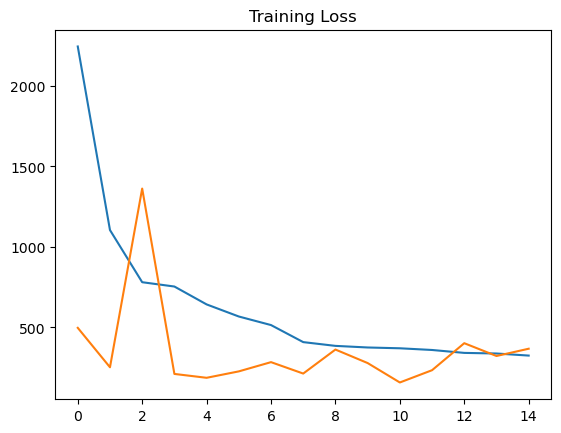

In [8]:
sns.lineplot(x=range(len(train_losses)), y=train_losses).set_title("Training Loss")
sns.lineplot(x=range(len(val_losses)), y=val_losses).set_title("Training Loss")
#Plot training and validation loss curves

end_time = datetime.now()
print(f"Training completed at {end_time.strftime('%Y-%m-%d %H:%M:%S')}")


total_duration = end_time - start_time
print(f"Total training duration: {total_duration}")

In [9]:
torch.save(model.state_dict(), "model.pth")